In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [232]:
new_df=pd.read_csv("/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/MLOPS/dateset final.csv")

In [234]:
dropped_rows

35847

In [1]:
import keras
print(keras.__version__)


/Users/aayushjain/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


2.15.0


In [3]:
import h5py

with h5py.File('/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/model/Scales and Models/lstm_kolkata_city.h5', 'r') as f:
    model_config = f.attrs.get('model_config')
    print(model_config)


{"class_name": "Sequential", "config": {"name": "sequential_1", "layers": [{"class_name": "InputLayer", "config": {"batch_input_shape": [null, 1, 7], "dtype": "float32", "sparse": false, "ragged": false, "name": "lstm_2_input"}}, {"class_name": "LSTM", "config": {"name": "lstm_2", "trainable": true, "dtype": "float32", "batch_input_shape": [null, 1, 7], "return_sequences": true, "return_state": false, "go_backwards": false, "stateful": false, "unroll": false, "time_major": false, "units": 128, "activation": "tanh", "recurrent_activation": "sigmoid", "use_bias": true, "kernel_initializer": {"module": "keras.initializers", "class_name": "GlorotUniform", "config": {"seed": null}, "registered_name": null}, "recurrent_initializer": {"module": "keras.initializers", "class_name": "Orthogonal", "config": {"gain": 1.0, "seed": null}, "registered_name": null}, "bias_initializer": {"module": "keras.initializers", "class_name": "Zeros", "config": {}, "registered_name": null}, "unit_forget_bias": t

In [2]:
try:
    from keras.models import load_model
    from keras.initializers import Orthogonal

    # Custom objects dictionary
    custom_objects = {
        'Orthogonal': Orthogonal
    }

    # Load the model with custom objects
    model = load_model('/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/model/Scales and Models/lstm_kolkata_city.h5', custom_objects=custom_objects)
    print("Model loaded successfully")

except ValueError as e:
    print(f"Error loading model: {e}")

except Exception as e:
    print(f"An unexpected error occurred: {e}")


2024-06-13 11:37:25.433673: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2024-06-13 11:37:25.433772: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2024-06-13 11:37:25.433794: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2024-06-13 11:37:25.434399: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-06-13 11:37:25.434954: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model loaded successfully


In [236]:
1.5/6.5

0.23076923076923078

In [233]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142692 entries, 0 to 142691
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Unnamed: 0                 142692 non-null  int64  
 1   bookingStatusText          142692 non-null  object 
 2   bookingId                  142692 non-null  object 
 3   pickup.location.latitude   142692 non-null  float64
 4   pickup.location.longitude  142692 non-null  float64
 5   bookingDateDevice          142692 non-null  object 
 6   createdBy.mobile           142692 non-null  float64
 7   date_column                142692 non-null  object 
 8   date_only                  142692 non-null  object 
dtypes: float64(3), int64(1), object(5)
memory usage: 9.8+ MB


In [ ]:
dataset['date_column']

In [ ]:
dataset['date_column'] = pd.to_datetime(dataset['date_column'])

dataset['date_only'] = dataset['date_column'].dt.date


In [240]:
dataset['date_only'].value_counts().sort_index()

date_only
2024-05-21     4641
2024-05-22     7263
2024-05-23     5759
2024-05-24     7253
2024-05-25     6756
2024-05-26     4016
2024-05-27     9723
2024-05-28     6682
2024-05-29     7432
2024-05-30     7400
2024-05-31    10702
2024-06-01     5242
2024-06-02     6618
2024-06-03     7425
2024-06-04     4604
Name: count, dtype: int64

In [ ]:
comparison_date = pd.to_datetime('2024-06-05').date()

filtered_dataset = dataset[dataset['date_only'] < comparison_date]

# Display the filtered DataFrame
print(filtered_dataset)

In [ ]:
filtered_dataset['date_only'].value_counts()

In [ ]:
dataset=filtered_dataset
dataset.groupby(['date_only','bookingStatusText']).size()

In [ ]:
dataset['bookingStatusText'].value_counts()

In [222]:
dataset['createdBy.mobile'].nunique()

39000

In [ ]:
data

In [ ]:
dataset['date_column'] = pd.to_datetime(dataset['date_column'])

dataset['10min_window'] = dataset['date_column'].dt.floor('10min')

deduped_data = dataset.sort_values(['createdBy.mobile', 'date_column']).drop_duplicates(['createdBy.mobile', '10min_window'], keep='first')

dropped_rows = len(dataset) - len(deduped_data)

print(f"Number of rows dropped: {dropped_rows}")
print(deduped_data)
dataset=deduped_data

In [223]:
dataset['createdBy.mobile'].nunique()

39000

In [ ]:
dataset['bookingStatusText']

In [225]:
byuser=dataset.groupby(['createdBy.mobile','bookingStatusText']).size()

In [227]:
byuser.to_excel("byuser.xlsx",index=True)

KeyboardInterrupt: 

In [228]:
dataset['bookingStatusText'].value_counts()

bookingStatusText
Completed                        31147
Expired                          27585
Request Cancelled By Customer    22345
Customer Cancelled               20037
Cancel By Dispatcher               289
Completed By Dispatcher            113
Name: count, dtype: int64

In [229]:
filtered_completed=dataset[dataset['bookingStatusText']=='Completed']

In [231]:
31/17

1.8235294117647058

In [230]:
filtered_completed['createdBy.mobile'].nunique()

17741

In [ ]:
from datetime import datetime, timedelta

dataset['date'] = dataset['date_column'].dt.date
dataset['hour'] = dataset['date_column'].dt.hour
hourly_demand = dataset.groupby(['date', 'hour']).size().reset_index(name='y')
hourly_demand['ds'] = hourly_demand.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)
hourly_demand = hourly_demand.drop(columns=['date', 'hour'])
hourly_demand['ds'] = pd.to_datetime(hourly_demand['ds'])
hourly_demand_copy=hourly_demand

In [ ]:
hourly_demand

In [ ]:
from neuralprophet import NeuralProphet


In [85]:
m = NeuralProphet()
m.set_plotting_backend("plotly-static")  
metrics = m.fit(hourly_demand)

Epoch 160: 100%|██████████| 160/160 [00:00<00:00, 3061.30it/s, loss=0.0329, v_num=1, MAE=73.20, RMSE=111.0, Loss=0.0329, RegLoss=0.000]  


INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.722% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.722% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 485.68it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.722% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H
INFO - (NP.df_utils._infer_frequency) - Major frequency H corresponds to 99.722% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - H



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 449.26it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


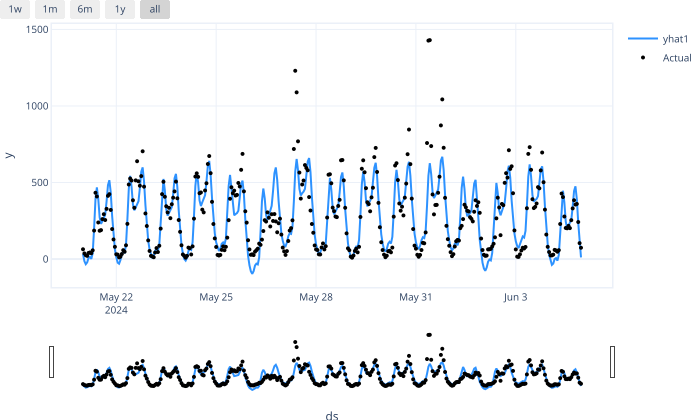

In [86]:
predicted = m.predict(hourly_demand_copy)
forecast = m.predict(hourly_demand_copy)
m.plot(forecast)


In [112]:
future = m.make_future_dataframe(periods=24, freq='H')
forecast = m.predict(future)
fig1 = m.plot(forecast)

TypeError: make_future_dataframe() got an unexpected keyword argument 'freq'

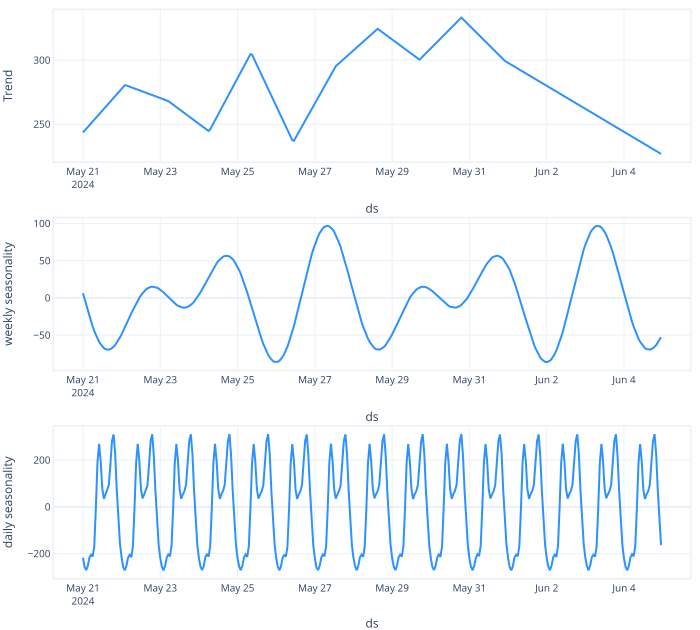

In [87]:
m.plot_components(forecast)


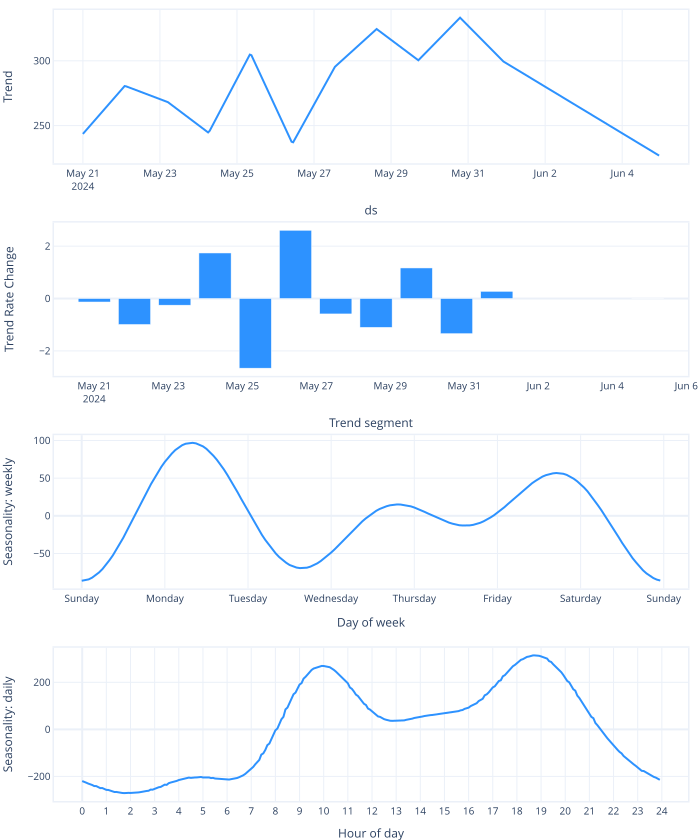

In [88]:
m.plot_parameters()


In [89]:
import geopandas as gpd
import geoplot.crs as gcrs
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geoplot as gplt

In [90]:
dataset['latitude'] = dataset['pickup.location.latitude'].astype(float)
dataset['longitude'] = dataset['pickup.location.longitude'].astype(float)

In [91]:
gdataset_coordinates = gpd.GeoDataFrame(dataset, geometry=gpd.points_from_xy(dataset.longitude, dataset.latitude))

gdf = gpd.GeoDataFrame(gdataset_coordinates, geometry=gpd.points_from_xy(gdataset_coordinates.longitude, gdataset_coordinates.latitude))

In [92]:
from haversine import haversine, Unit

dataset['latitude'] = dataset['latitude'].astype(float)
dataset['longitude'] = dataset['longitude'].astype(float)

dakshindari= (22.604396, 88.402249)
sector_5=(22.573464, 88.437846)
victoria_memorial=(22.545888, 88.344416)
howrah=(22.583474, 88.342969)
airport=(22.642434, 88.439351)

def calculate_distance(coords,lat, lon):
    point_coords = (lat, lon)
    return haversine(coords, point_coords, unit=Unit.KILOMETERS)

dataset['aerial_dist_dakshindari'] = dataset.apply(
    lambda row: calculate_distance(dakshindari,row['latitude'], row['longitude']), axis=1
)
dataset['aerial_dist_sector_V'] = dataset.apply(
    lambda row: calculate_distance(sector_5,row['latitude'], row['longitude']), axis=1
)
dataset['aerial_dist_victoria_memorial'] = dataset.apply(
    lambda row: calculate_distance(victoria_memorial,row['latitude'], row['longitude']), axis=1
)
dataset['aerial_dist_howrah'] = dataset.apply(
    lambda row: calculate_distance(howrah,row['latitude'], row['longitude']), axis=1
)
dataset['aerial_dist_airport'] = dataset.apply(
    lambda row: calculate_distance(airport,row['latitude'], row['longitude']), axis=1
)

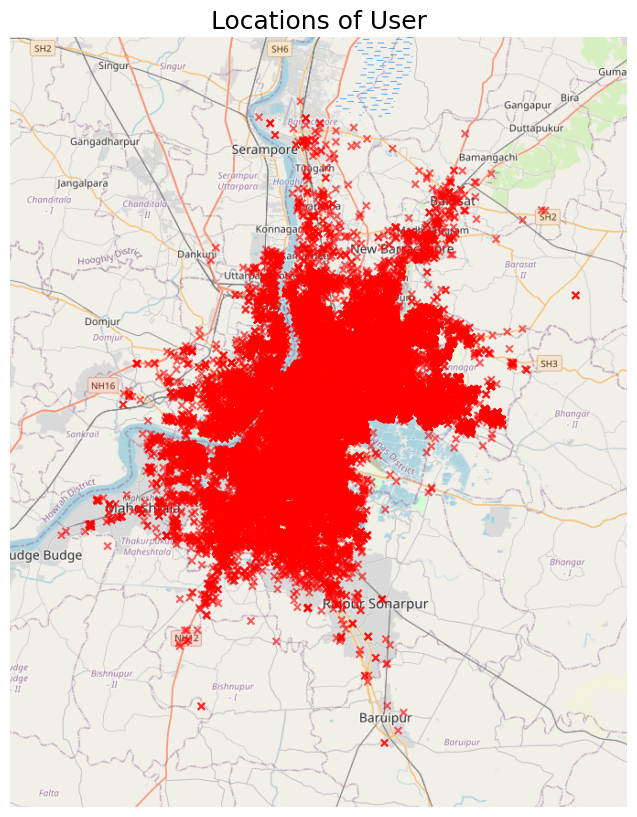

In [103]:
gactive_users_coordinates = gpd.GeoDataFrame(filtered_dataset, geometry=gpd.points_from_xy(filtered_dataset.longitude, filtered_dataset.latitude))

    # Ensure geometry is set correctly
gdf = gpd.GeoDataFrame(gactive_users_coordinates,geometry=gpd.points_from_xy(gactive_users_coordinates.longitude, gactive_users_coordinates.latitude) )

    # Plot the points with a marker
ax = gplt.webmap(gdf, projection=gcrs.WebMercator(), figsize=(10, 10))

gplt.pointplot(
        gdf, 
        ax=ax, 
        s=5,  # size of the points
        color='red',  # color of the points
        marker='x',  # shape of the points
        alpha=0.6  # transparency of the points
    )

plt.title(f'Locations of User', fontsize=18)
plt.show()

WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/1849864454.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/1849864454.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /Users/aayushjain/Library/Python/3.9/lib/python/site-packages/geoplot/geoplot.py:1304: FutureWarning:



`shade` is now deprecated in fav

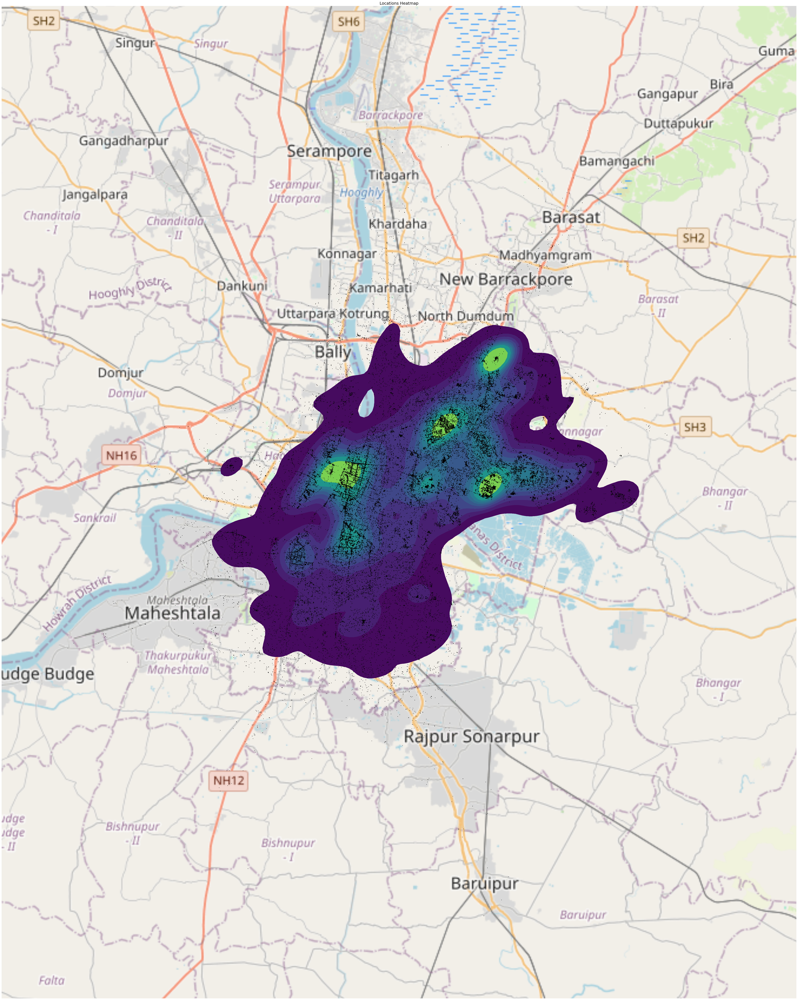

In [104]:
filtered_dataset['latitude'] = filtered_dataset['latitude'].astype(float)
filtered_dataset['longitude'] = filtered_dataset['longitude'].astype(float)

gfiltered_dataset_coordinates = gpd.GeoDataFrame(filtered_dataset, geometry=gpd.points_from_xy(filtered_dataset.longitude, filtered_dataset.latitude))

gdf = gpd.GeoDataFrame(gfiltered_dataset_coordinates, geometry=gpd.points_from_xy(gfiltered_dataset_coordinates.longitude, gfiltered_dataset_coordinates.latitude))

ax = gplt.kdeplot(
    gdf, cmap='viridis', projection=gcrs.WebMercator(), figsize=(80, 80),
    shade=True
)

gplt.pointplot(gdf, s=1, color='black', ax=ax)

gplt.webmap(gdf, ax=ax)

plt.title('Locations Heatmap', fontsize=18)
plt.show()



In [96]:
from prophet import Prophet


In [97]:
model = Prophet()
model.fit(hourly_demand)

12:30:43 - cmdstanpy - INFO - Chain [1] start processing
12:30:43 - cmdstanpy - INFO - Chain [1] done processing


In [113]:
import pickle

# Save the model to a file
with open('model.pkl', 'wb') as f:
    pickle.dump(model, f)


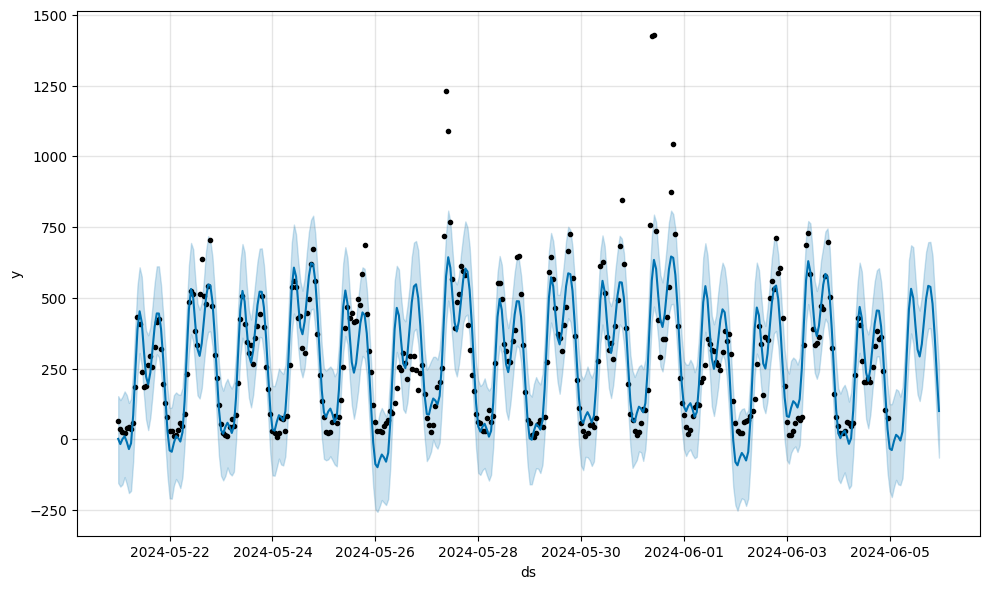

In [107]:
future = model.make_future_dataframe(periods=24, freq='H')
forecast = model.predict(future)
fig1 = model.plot(forecast)

In [99]:
forecast.tail(24)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
360,2024-06-05 00:00:00,267.628768,-178.417347,138.312309,267.628768,267.628768,-300.317130,-300.317130,-300.317130,-255.503963,-255.503963,-255.503963,-44.813167,-44.813167,-44.813167,0.0,0.0,0.0,-32.688362
361,2024-06-05 01:00:00,267.266614,-204.471291,123.217137,267.266614,267.266614,-305.211842,-305.211842,-305.211842,-265.760066,-265.760066,-265.760066,-39.451776,-39.451776,-39.451776,0.0,0.0,0.0,-37.945227
362,2024-06-05 02:00:00,266.904461,-162.026961,144.848288,266.901018,266.906755,-273.797253,-273.797253,-273.797253,-239.899823,-239.899823,-239.899823,-33.897429,-33.897429,-33.897429,0.0,0.0,0.0,-6.892792
363,2024-06-05 03:00:00,266.542308,-132.121361,172.275136,266.529261,266.554517,-250.512500,-250.512500,-250.512500,-222.285234,-222.285234,-222.285234,-28.227266,-28.227266,-28.227266,0.0,0.0,0.0,16.029807
364,2024-06-05 04:00:00,266.180154,-151.335682,162.843146,266.155203,266.203265,-257.195865,-257.195865,-257.195865,-234.677741,-234.677741,-234.677741,-22.518124,-22.518124,-22.518124,0.0,0.0,0.0,8.984289
365,2024-06-05 05:00:00,265.818001,-157.812699,158.803761,265.769538,265.854138,-270.199647,-270.199647,-270.199647,-253.354133,-253.354133,-253.354133,-16.845514,-16.845514,-16.845514,0.0,0.0,0.0,-4.381646
366,2024-06-05 06:00:00,265.455847,-126.571347,187.883835,265.389587,265.508426,-237.851674,-237.851674,-237.851674,-226.569057,-226.569057,-226.569057,-11.282617,-11.282617,-11.282617,0.0,0.0,0.0,27.604173
367,2024-06-05 07:00:00,265.093694,-26.075740,300.595241,265.007526,265.169260,-126.962396,-126.962396,-126.962396,-121.063072,-121.063072,-121.063072,-5.899325,-5.899325,-5.899325,0.0,0.0,0.0,138.131298
368,2024-06-05 08:00:00,264.731540,153.371254,470.383071,264.620867,264.828988,40.813172,40.813172,40.813172,41.574500,41.574500,41.574500,-0.761328,-0.761328,-0.761328,0.0,0.0,0.0,305.544712
369,2024-06-05 09:00:00,264.369387,297.975408,625.778085,264.230955,264.497980,195.913528,195.913528,195.913528,191.842803,191.842803,191.842803,4.070725,4.070725,4.070725,0.0,0.0,0.0,460.282915


In [100]:
filtered_dataset=dataset[dataset['aerial_dist_airport']<200]

In [108]:
dataset=filtered_dataset

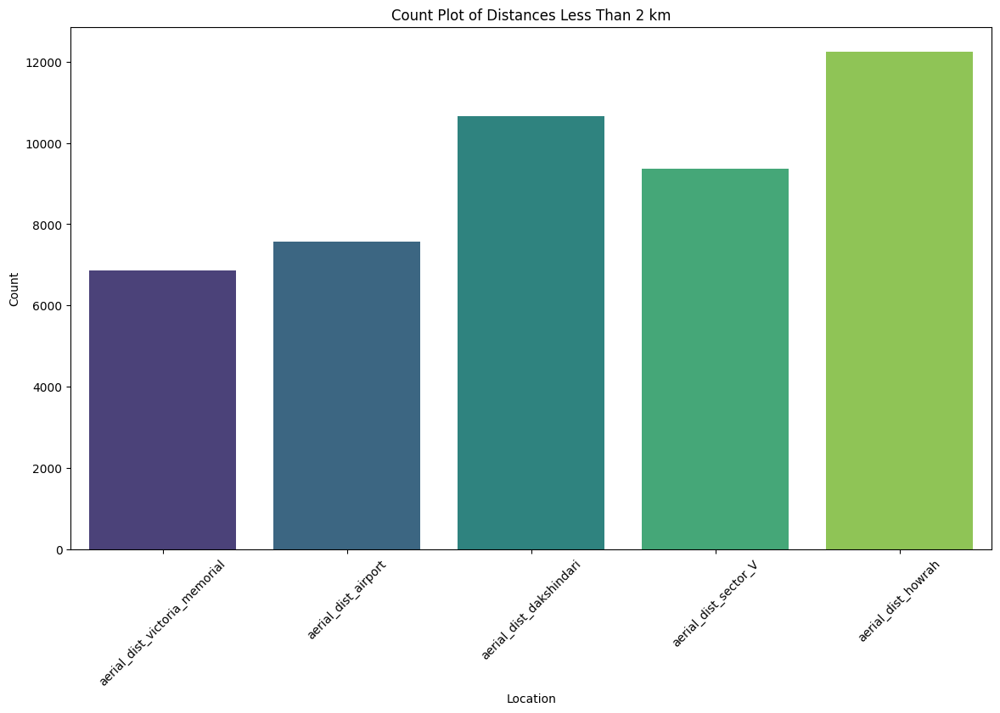

In [111]:
import seaborn as sns
filtered_data = dataset[
    (dataset['aerial_dist_victoria_memorial'] < 2) |
    (dataset['aerial_dist_airport'] < 2) |
    (dataset['aerial_dist_dakshindari'] < 2) |
    (dataset['aerial_dist_sector_V'] < 2) |
    (dataset['aerial_dist_howrah'] < 2)

]

# Melt the DataFrame to long format
melted_data = filtered_data.melt(
    value_vars=[
        'aerial_dist_victoria_memorial',
        'aerial_dist_airport',
        'aerial_dist_dakshindari',
        'aerial_dist_sector_V',
        'aerial_dist_howrah'
    ],
    var_name='location',
    value_name='distance'
)

# Filter the melted data where distance is less than 2
melted_data = melted_data[melted_data['distance'] < 2]

# Plot count plots
plt.figure(figsize=(14, 8))
sns.countplot(data=melted_data, x='location', palette='viridis')
plt.title('Count Plot of Distances Less Than 2 km')
plt.xlabel('Location')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [114]:
dataset_victoria=dataset[dataset['aerial_dist_victoria_memorial']<2]
dataset_airport=dataset[dataset['aerial_dist_airport']<2]
dataset_dakshindari=dataset[dataset['aerial_dist_dakshindari']<2]
dataset_howrah=dataset[dataset['aerial_dist_howrah']<2]
dataset_sectorV=dataset[dataset['aerial_dist_sector_V']<2]

WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/1427199967.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/1427199967.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


13:00:35 - cmdstanpy - INFO - Chain [1] start processing
13:00:36 - cmdstanpy - INFO - Chain [1] done processing


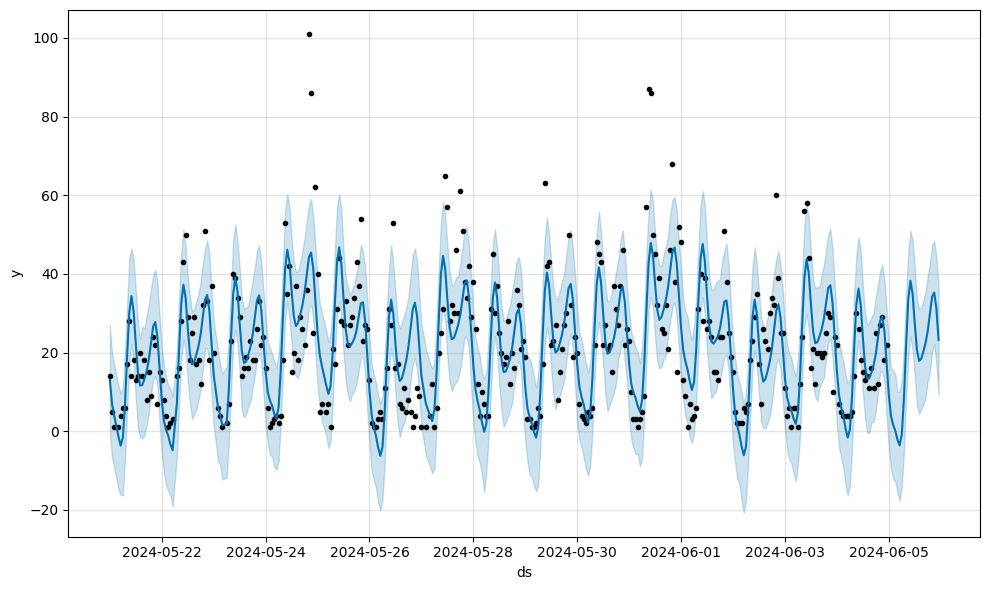

In [115]:
dataset_airport['date'] = dataset_airport['date_column'].dt.date
dataset_airport['hour'] = dataset_airport['date_column'].dt.hour
hourly_demand_airport = dataset_airport.groupby(['date', 'hour']).size().reset_index(name='y')
hourly_demand_airport['ds'] = hourly_demand_airport.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)
hourly_demand_airport = hourly_demand_airport.drop(columns=['date', 'hour'])
hourly_demand_airport['ds'] = pd.to_datetime(hourly_demand_airport['ds'])
model_airport_prophet = Prophet()
model_airport_prophet.fit(hourly_demand_airport)

future = model_airport_prophet.make_future_dataframe(periods=24, freq='H')
forecast = model_airport_prophet.predict(future)
fig1 = model_airport_prophet.plot(forecast)


In [116]:
import pickle

# Save the model to a file
with open('model_airport_prophet.pkl', 'wb') as f:
    pickle.dump(model_airport_prophet, f)


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/540279314.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/540279314.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


13:01:50 - cmdstanpy - INFO - Chain [1] start processing
13:01:50 - cmdstanpy - INFO - Chain [1] done processing


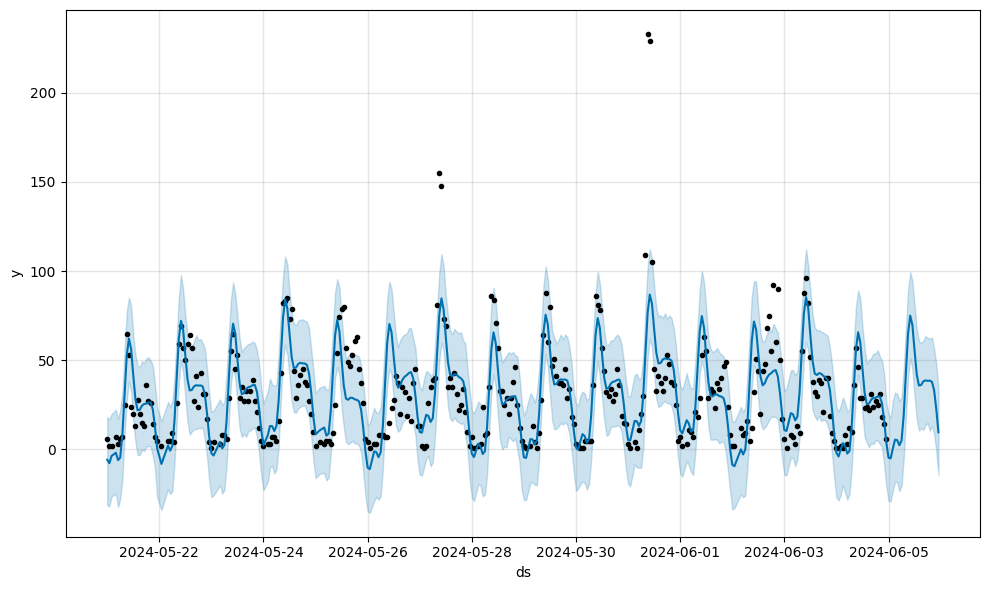

In [117]:
dataset_dakshindari['date'] = dataset_dakshindari['date_column'].dt.date
dataset_dakshindari['hour'] = dataset_dakshindari['date_column'].dt.hour
hourly_demand_airport = dataset_dakshindari.groupby(['date', 'hour']).size().reset_index(name='y')
hourly_demand_airport['ds'] = hourly_demand_airport.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)
hourly_demand_airport = hourly_demand_airport.drop(columns=['date', 'hour'])
hourly_demand_airport['ds'] = pd.to_datetime(hourly_demand_airport['ds'])
model_dakshindari_prophet = Prophet()
model_dakshindari_prophet.fit(hourly_demand_airport)

future = model_dakshindari_prophet.make_future_dataframe(periods=24, freq='H')
forecast = model_dakshindari_prophet.predict(future)
fig1 = model_dakshindari_prophet.plot(forecast)


In [118]:
import pickle

# Save the model to a file
with open('model_dakshindari_prophet.pkl', 'wb') as f:
    pickle.dump(model_dakshindari_prophet, f)


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/1277259395.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/1277259395.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


13:02:44 - cmdstanpy - INFO - Chain [1] start processing
13:02:44 - cmdstanpy - INFO - Chain [1] done processing


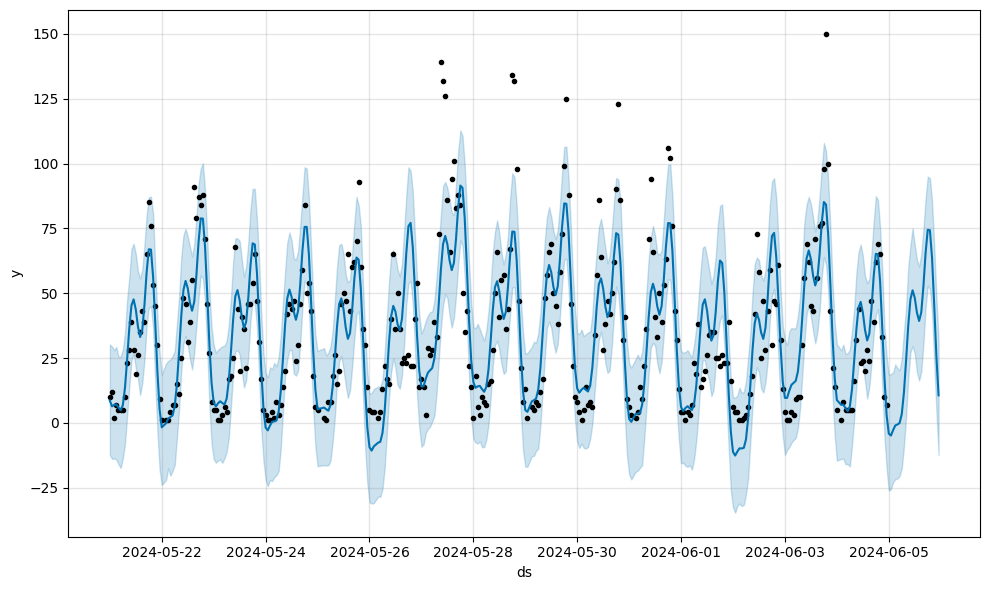

In [119]:
dataset_howrah['date'] = dataset_howrah['date_column'].dt.date
dataset_howrah['hour'] = dataset_howrah['date_column'].dt.hour
hourly_demand_airport = dataset_howrah.groupby(['date', 'hour']).size().reset_index(name='y')
hourly_demand_airport['ds'] = hourly_demand_airport.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)
hourly_demand_airport = hourly_demand_airport.drop(columns=['date', 'hour'])
hourly_demand_airport['ds'] = pd.to_datetime(hourly_demand_airport['ds'])
model_howrah_prophet = Prophet()
model_howrah_prophet.fit(hourly_demand_airport)

future = model_howrah_prophet.make_future_dataframe(periods=24, freq='H')
forecast = model_howrah_prophet.predict(future)
fig1 = model_howrah_prophet.plot(forecast)


In [120]:
import pickle

# Save the model to a file
with open('model_howrah_prophet.pkl', 'wb') as f:
    pickle.dump(model_howrah_prophet, f)


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/3705915633.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/3705915633.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


13:03:46 - cmdstanpy - INFO - Chain [1] start processing
13:03:46 - cmdstanpy - INFO - Chain [1] done processing


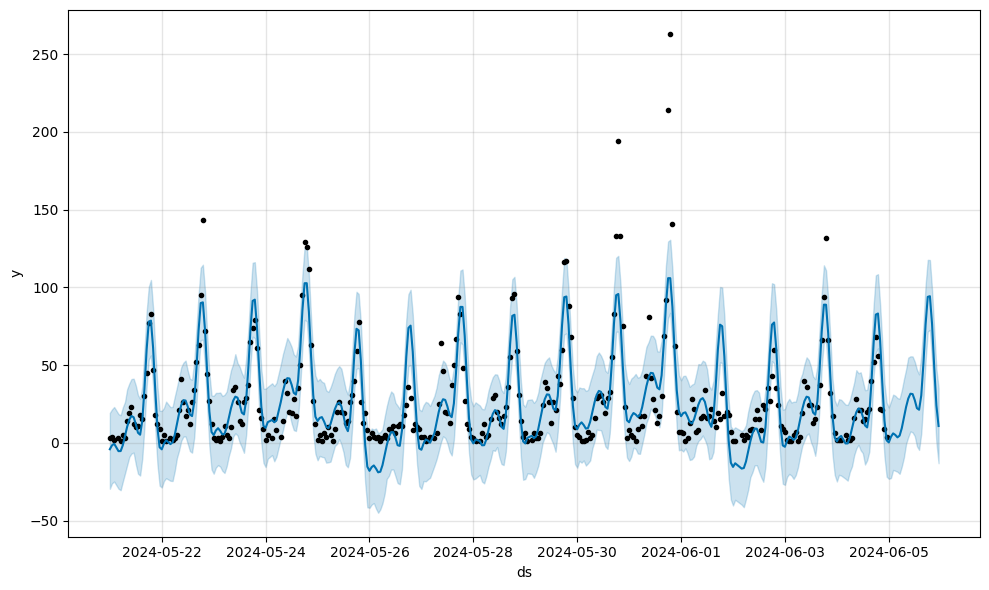

In [121]:
dataset_sectorV['date'] = dataset_sectorV['date_column'].dt.date
dataset_sectorV['hour'] = dataset_sectorV['date_column'].dt.hour
hourly_demand_airport = dataset_sectorV.groupby(['date', 'hour']).size().reset_index(name='y')
hourly_demand_airport['ds'] = hourly_demand_airport.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)
hourly_demand_airport = hourly_demand_airport.drop(columns=['date', 'hour'])
hourly_demand_airport['ds'] = pd.to_datetime(hourly_demand_airport['ds'])
model_sectorV_prophet = Prophet()
model_sectorV_prophet.fit(hourly_demand_airport)

future = model_sectorV_prophet.make_future_dataframe(periods=24, freq='H')
forecast = model_sectorV_prophet.predict(future)
fig1 = model_sectorV_prophet.plot(forecast)


In [122]:
import pickle

# Save the model to a file
with open('model_sectorV_prophet.pkl', 'wb') as f:
    pickle.dump(model_sectorV_prophet, f)


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/438653860.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/438653860.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


13:21:44 - cmdstanpy - INFO - Chain [1] start processing
13:21:45 - cmdstanpy - INFO - Chain [1] done processing


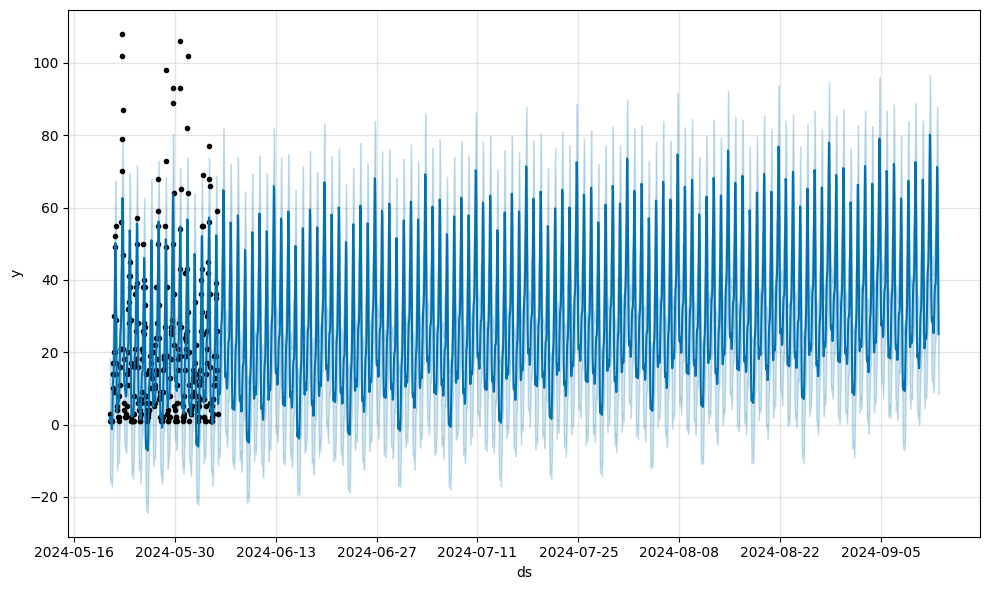

In [167]:
dataset_victoria['date'] = dataset_victoria['date_column'].dt.date
dataset_victoria['hour'] = dataset_victoria['date_column'].dt.hour
hourly_demand_airport = dataset_victoria.groupby(['date', 'hour']).size().reset_index(name='y')
hourly_demand_airport['ds'] = hourly_demand_airport.apply(lambda row: datetime.combine(row['date'], datetime.min.time()) + timedelta(hours=row['hour']), axis=1)
hourly_demand_airport = hourly_demand_airport.drop(columns=['date', 'hour'])
hourly_demand_airport['ds'] = pd.to_datetime(hourly_demand_airport['ds'])
model_victoria_prophet = Prophet()
model_victoria_prophet.fit(hourly_demand_airport)

future = model_victoria_prophet.make_future_dataframe(periods=2400, freq='H')
forecast = model_victoria_prophet.predict(future)
fig1 = model_victoria_prophet.plot(forecast)


In [124]:
import pickle

# Save the model to a file
with open('model_victoria_prophet.pkl', 'wb') as f:
    pickle.dump(model_victoria_prophet, f)


In [126]:
hourly_demand.head()


,y,ds
0,64,2024-05-21 00:00:00
1,37,2024-05-21 01:00:00
2,25,2024-05-21 02:00:00
3,21,2024-05-21 03:00:00
4,40,2024-05-21 04:00:00


In [153]:
weather_conditions=pd.read_csv("/Users/aayushjain/codes/projects/company assignements/Snape/City Heatmap/dataset/SaltLake2_20240506_20240605.csv")

In [154]:
weather_conditions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37007 entries, 0 to 37006
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   city_name          37007 non-null  object 
 1   locality_name      37007 non-null  object 
 2   device_date_time   37007 non-null  object 
 3   rain_intensity     37007 non-null  float64
 4   rain_accumulation  37007 non-null  float64
 5   humidity           37007 non-null  float64
 6   temperature        37007 non-null  float64
 7   wind_direction     37007 non-null  float64
 8   wind_speed         37007 non-null  float64
dtypes: float64(6), object(3)
memory usage: 2.5+ MB


In [155]:
weather_conditions.loc[23038:]

,city_name,locality_name,device_date_time,rain_intensity,rain_accumulation,humidity,temperature,wind_direction,wind_speed
23038,Kolkata,Salt Lake 2,2024-05-21 00:04:00,0.0,0.0,91.42,27.43,268.4,0.08
23039,Kolkata,Salt Lake 2,2024-05-21 00:03:00,0.0,0.0,91.34,27.42,268.4,0.21
23040,Kolkata,Salt Lake 2,2024-05-21 00:02:00,0.0,0.0,91.34,27.44,239.6,0.58
23041,Kolkata,Salt Lake 2,2024-05-21 00:01:00,0.0,0.0,91.51,27.43,253.5,0.33
23042,Kolkata,Salt Lake 2,2024-05-21 00:00:00,0.0,0.0,91.31,27.43,196.3,0.44
...,...,...,...,...,...,...,...,...,...
37002,Kolkata,Salt Lake 2,2024-05-11 07:13:00,0.0,0.0,85.79,30.16,260.8,0.46
37003,Kolkata,Salt Lake 2,2024-05-11 07:12:00,0.0,0.0,85.85,30.16,238.4,1.09
37004,Kolkata,Salt Lake 2,2024-05-11 07:11:00,0.0,0.0,86.21,30.14,243.6,0.57
37005,Kolkata,Salt Lake 2,2024-05-11 07:10:00,0.0,0.0,86.39,30.05,113.1,0.30


In [156]:
weather_conditions.loc[:23042]

,city_name,locality_name,device_date_time,rain_intensity,rain_accumulation,humidity,temperature,wind_direction,wind_speed
0,Kolkata,Salt Lake 2,2024-06-05 23:59:00,0.0,0.0,89.23,31.13,257.0,1.27
1,Kolkata,Salt Lake 2,2024-06-05 23:58:00,0.0,0.0,89.06,31.14,192.2,0.22
2,Kolkata,Salt Lake 2,2024-06-05 23:57:00,0.0,0.0,89.05,31.16,278.8,0.72
3,Kolkata,Salt Lake 2,2024-06-05 23:56:00,0.0,0.0,89.03,31.16,262.2,0.95
4,Kolkata,Salt Lake 2,2024-06-05 23:55:00,0.0,0.0,88.88,31.17,241.6,0.39
...,...,...,...,...,...,...,...,...,...
23038,Kolkata,Salt Lake 2,2024-05-21 00:04:00,0.0,0.0,91.42,27.43,268.4,0.08
23039,Kolkata,Salt Lake 2,2024-05-21 00:03:00,0.0,0.0,91.34,27.42,268.4,0.21
23040,Kolkata,Salt Lake 2,2024-05-21 00:02:00,0.0,0.0,91.34,27.44,239.6,0.58
23041,Kolkata,Salt Lake 2,2024-05-21 00:01:00,0.0,0.0,91.51,27.43,253.5,0.33


In [157]:
weather_conditions=weather_conditions.loc[:23042:60]

In [160]:
weather_conditions.head()

,city_name,locality_name,device_date_time,rain_intensity,rain_accumulation,humidity,temperature,wind_direction,wind_speed
0,Kolkata,Salt Lake 2,2024-06-05 23:59:00,0.0,0.0,89.23,31.13,257.0,1.27
60,Kolkata,Salt Lake 2,2024-06-05 22:59:00,0.0,0.0,86.73,31.37,259.2,1.45
120,Kolkata,Salt Lake 2,2024-06-05 21:59:00,0.0,0.0,85.54,31.71,259.1,0.52
180,Kolkata,Salt Lake 2,2024-06-05 20:59:00,0.0,0.0,85.17,32.15,259.8,0.16
240,Kolkata,Salt Lake 2,2024-06-05 19:59:00,0.0,0.0,79.94,32.65,229.6,1.02


In [158]:
weather_conditions['device_date_time']= pd.to_datetime(weather_conditions['device_date_time'])


In [ ]:
weather_conditions['HourofDate']=weather_conditions

In [159]:
hourly_demand.head()


,y,ds
0,64,2024-05-21 00:00:00
1,37,2024-05-21 01:00:00
2,25,2024-05-21 02:00:00
3,21,2024-05-21 03:00:00
4,40,2024-05-21 04:00:00


In [169]:
hourly_demand.to_excel("hourly_demand_filt.xlsx",index=True)

In [165]:
weather_conditions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 385 entries, 0 to 23040
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city_name          385 non-null    object        
 1   locality_name      385 non-null    object        
 2   device_date_time   385 non-null    datetime64[ns]
 3   rain_intensity     385 non-null    float64       
 4   rain_accumulation  385 non-null    float64       
 5   humidity           385 non-null    float64       
 6   temperature        385 non-null    float64       
 7   wind_direction     385 non-null    float64       
 8   wind_speed         385 non-null    float64       
 9   date_hour          385 non-null    object        
dtypes: datetime64[ns](1), float64(6), object(3)
memory usage: 30.2+ KB


In [168]:
weather_conditions.to_excel("weather_conditions_filt.xlsx",index=True)

In [161]:
hourly_demand['ds'] = pd.to_datetime(hourly_demand['ds'])

# Extract date and hour from 'device_date_time' and 'ds'
weather_conditions['date_hour'] = weather_conditions['device_date_time'].dt.strftime('%hourly_demand-%m-%d %H')
hourly_demand['date_hour'] = hourly_demand['ds'].dt.strftime('%hourly_demand-%m-%d %H')

# Merge the two DataFrames on the 'date_hour' column
merged_df = pd.merge(weather_conditions, hourly_demand, on='date_hour', how='inner')

# Drop the redundant 'date_hour' column if needed
merged_df = merged_df.drop(columns=['date_hour'])

In [171]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 361 entries, 0 to 360
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city_name          361 non-null    object        
 1   locality_name      361 non-null    object        
 2   device_date_time   361 non-null    datetime64[ns]
 3   rain_intensity     361 non-null    float64       
 4   rain_accumulation  361 non-null    float64       
 5   humidity           361 non-null    float64       
 6   temperature        361 non-null    float64       
 7   wind_direction     361 non-null    float64       
 8   wind_speed         361 non-null    float64       
 9   y                  361 non-null    int64         
 10  ds                 361 non-null    datetime64[ns]
dtypes: datetime64[ns](2), float64(6), int64(1), object(2)
memory usage: 31.1+ KB


<Axes: title={'center': 'Hourly Temperature/ Salt Lake'}>

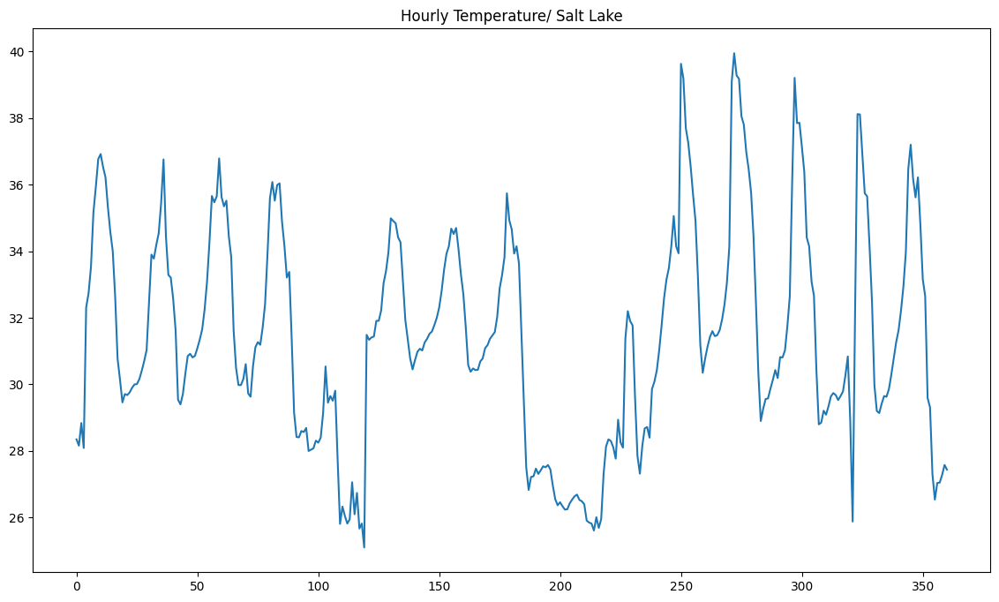

In [172]:
merged_df['temperature'].plot(figsize=(14, 8), title='Hourly Temperature/ Salt Lake')


<Axes: title={'center': 'Hourly Rain Accumulation/ Salt Lake'}>

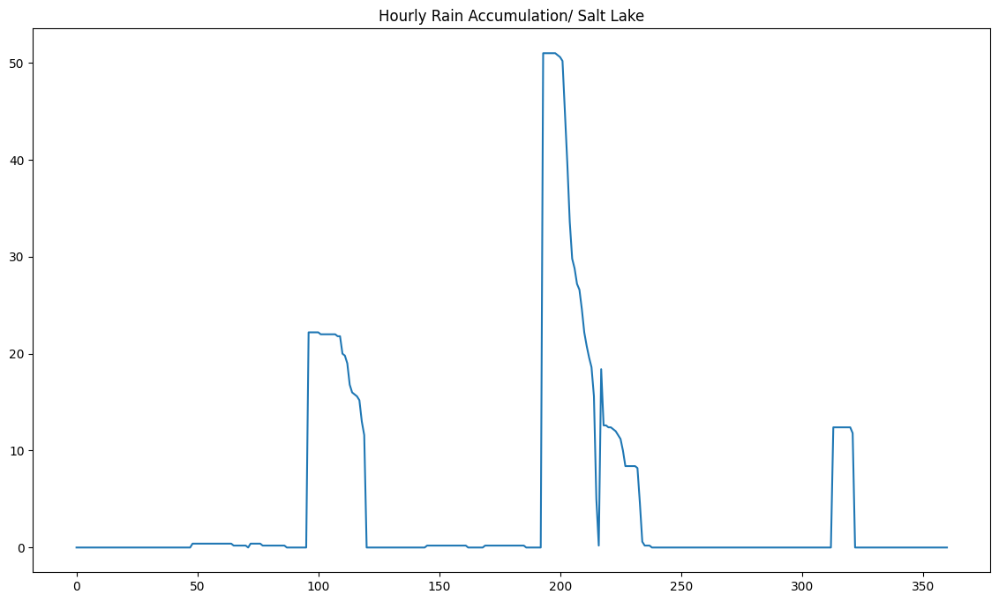

In [220]:
merged_df['rain_accumulation'].plot(figsize=(14, 8), title='Hourly Rain Accumulation/ Salt Lake')


<Axes: title={'center': 'Hourly Requests'}>

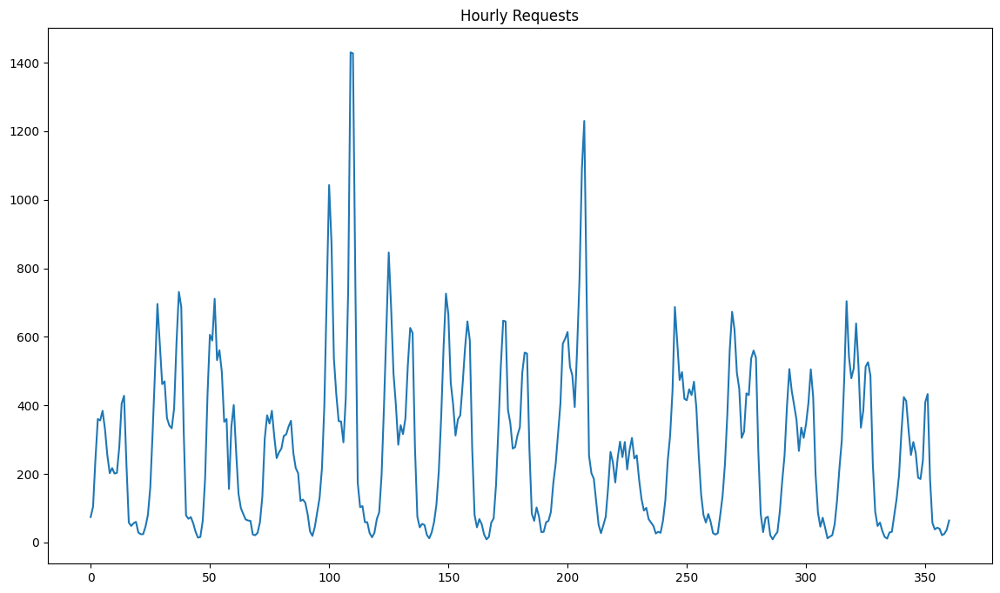

In [221]:
merged_df['y'].plot(figsize=(14, 8), title='Hourly Requests')


In [175]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 361 entries, 0 to 360
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   city_name          361 non-null    object        
 1   locality_name      361 non-null    object        
 2   device_date_time   361 non-null    datetime64[ns]
 3   rain_intensity     361 non-null    float64       
 4   rain_accumulation  361 non-null    float64       
 5   humidity           361 non-null    float64       
 6   temperature        361 non-null    float64       
 7   wind_direction     361 non-null    float64       
 8   wind_speed         361 non-null    float64       
 9   y                  361 non-null    int64         
 10  ds                 361 non-null    datetime64[ns]
dtypes: datetime64[ns](2), float64(6), int64(1), object(2)
memory usage: 31.1+ KB


In [176]:
hourly_demand=merged_df[['device_date_time','rain_intensity','rain_accumulation','temperature','y']]

In [177]:
hourly_demand['ds']=hourly_demand['device_date_time']

WARNING - (py.warnings._showwarnmsg) - /var/folders/q_/dn720rf91691y39h0s_hr_280000gn/T/ipykernel_98676/2369891195.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




In [187]:
hourly_demand=merged_df[['ds','rain_intensity','rain_accumulation','temperature','y']]

In [188]:
hourly_demand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 361 entries, 0 to 360
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   ds                 361 non-null    datetime64[ns]
 1   rain_intensity     361 non-null    float64       
 2   rain_accumulation  361 non-null    float64       
 3   temperature        361 non-null    float64       
 4   y                  361 non-null    int64         
dtypes: datetime64[ns](1), float64(3), int64(1)
memory usage: 14.2 KB


In [189]:
hourly_demand = hourly_demand.set_index('ds')


In [190]:
hourly_demand.head()

,rain_intensity,rain_accumulation,temperature,y
ds,,,,
2024-06-04 23:00:00,0.0,0.0,28.35,74
2024-06-04 22:00:00,0.0,0.0,28.16,104
2024-06-04 21:00:00,0.0,0.0,28.84,242
2024-06-04 20:00:00,0.0,0.0,28.09,360
2024-06-04 19:00:00,0.0,0.0,32.31,356


In [193]:
# Sort the DataFrame in ascending order based on the index (ds column)
hourly_demand = hourly_demand.sort_index(ascending=True)



In [194]:
for lag in [1, 8, 12, 24]:
    hourly_demand[f'lag_{lag}'] = hourly_demand['y'].shift(lag)

In [195]:
hourly_demand.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 361 entries, 2024-05-21 00:00:00 to 2024-06-04 23:00:00
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rain_intensity     361 non-null    float64
 1   rain_accumulation  361 non-null    float64
 2   temperature        361 non-null    float64
 3   y                  361 non-null    int64  
 4   lag_1              360 non-null    float64
 5   lag_8              353 non-null    float64
 6   lag_12             349 non-null    float64
 7   lag_24             337 non-null    float64
dtypes: float64(7), int64(1)
memory usage: 25.4 KB


In [196]:
hourly_demand=hourly_demand.dropna()

In [197]:
hourly_demand.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 337 entries, 2024-05-22 00:00:00 to 2024-06-04 23:00:00
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rain_intensity     337 non-null    float64
 1   rain_accumulation  337 non-null    float64
 2   temperature        337 non-null    float64
 3   y                  337 non-null    int64  
 4   lag_1              337 non-null    float64
 5   lag_8              337 non-null    float64
 6   lag_12             337 non-null    float64
 7   lag_24             337 non-null    float64
dtypes: float64(7), int64(1)
memory usage: 23.7 KB


In [198]:
data=hourly_demand

In [200]:
data.head()

,rain_intensity,rain_accumulation,temperature,y,lag_1,lag_8,lag_12,lag_24
ds,,,,,,,,
2024-05-22 00:00:00,0.0,0.0,29.86,31,80.0,255.0,185.0,64.0
2024-05-22 01:00:00,0.0,0.0,29.63,29,31.0,328.0,189.0,37.0
2024-05-22 02:00:00,0.0,0.0,29.65,11,29.0,413.0,261.0,25.0
2024-05-22 03:00:00,0.0,0.0,29.42,16,11.0,424.0,293.0,21.0
2024-05-22 04:00:00,0.0,0.0,29.14,33,16.0,321.0,255.0,40.0


In [201]:
data.tail()

,rain_intensity,rain_accumulation,temperature,y,lag_1,lag_8,lag_12,lag_24
ds,,,,,,,,
2024-06-04 19:00:00,0.0,0.0,32.31,356,384.0,278.0,58.0,696.0
2024-06-04 20:00:00,0.0,0.0,28.09,360,356.0,203.0,229.0,502.0
2024-06-04 21:00:00,0.0,0.0,28.84,242,360.0,201.0,428.0,323.0
2024-06-04 22:00:00,0.0,0.0,28.16,104,242.0,217.0,405.0,160.0
2024-06-04 23:00:00,0.0,0.0,28.35,74,104.0,202.0,278.0,80.0


In [209]:
data_changed=data
data_changed=data_changed[['y','rain_intensity','rain_accumulation','temperature','lag_1','lag_8','lag_12','lag_24']]

In [211]:
data=data_changed

In [216]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

train_data = data[:'2024-06-02 00:00:00']
test_data = data['2024-06-02 00:01:00':]

# Normalize data
scaler = MinMaxScaler()
train_data_scaled = scaler.fit_transform(train_data)
test_data_scaled = scaler.transform(test_data)

# Define the number of time steps and features
TIME_STEPS = 24
N_FEATURES = train_data_scaled.shape[1] - 1  # Excluding the target variable 'y'

# Create input and target sequences for train and test data
def create_sequences(data, time_steps=TIME_STEPS):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps, :-1])  # Input sequence (excluding target)
        y.append(data[i+time_steps, 0])  # Target variable ('y')
    return np.array(X), np.array(y)

X_train, y_train = create_sequences(train_data_scaled)
X_test, y_test = create_sequences(test_data_scaled)

# Reshape input data for LSTM
X_train = X_train.reshape(X_train.shape[0], TIME_STEPS, N_FEATURES)
X_test = X_test.reshape(X_test.shape[0], TIME_STEPS, N_FEATURES)

# Build the LSTM model

model = Sequential()
model.add(LSTM(128, input_shape=(TIME_STEPS, N_FEATURES), return_sequences=True))
model.add(LSTM(32))  # Added another LSTM layer
model.add(Dropout(0.5))  # Added a Dropout layer
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test))

# Make predictions on test data
y_pred = model.predict(X_test)

Epoch 1/100
8/8 [==============================] - 3s 158ms/step - loss: 0.0524 - val_loss: 0.0203
Epoch 2/100
8/8 [==============================] - 0s 21ms/step - loss: 0.0330 - val_loss: 0.0165
Epoch 3/100
8/8 [==============================] - 0s 21ms/step - loss: 0.0315 - val_loss: 0.0153
Epoch 4/100
8/8 [==============================] - 0s 19ms/step - loss: 0.0278 - val_loss: 0.0153
Epoch 5/100
8/8 [==============================] - 0s 20ms/step - loss: 0.0258 - val_loss: 0.0157
Epoch 6/100
8/8 [==============================] - 0s 19ms/step - loss: 0.0245 - val_loss: 0.0156
Epoch 7/100
8/8 [==============================] - 0s 20ms/step - loss: 0.0226 - val_loss: 0.0149
Epoch 8/100
8/8 [==============================] - 0s 23ms/step - loss: 0.0229 - val_loss: 0.0150
Epoch 9/100
8/8 [==============================] - 0s 22ms/step - loss: 0.0207 - val_loss: 0.0144
Epoch 10/100
8/8 [==============================] - 0s 21ms/step - loss: 0.0202 - val_loss: 0.0139
Epoch 11/100
8/8 [

In [217]:
y_min = scaler.data_min_[0]  # Assuming 'y' is the first column
y_max = scaler.data_max_[0]  # Assuming 'y' is the first column

# Inverse transform predictions to original scale
y_pred_original = y_pred * (y_max - y_min) + y_min

In [218]:
y_test_original = y_test * (y_max - y_min) + y_min
y_test_original_slit=y_test_original[0:200]
y_pred_original_slit=y_pred_original[0:200]
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(y_test_original_slit, y_pred_original_slit)

print("Mean Squared Error:", mse)

import numpy as np

rmse = np.sqrt(mean_squared_error(y_test_original_slit, y_pred_original_slit))

print("Root Mean Squared Error:", rmse)

from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(y_test_original_slit, y_pred_original_slit)

print("Mean Absolute Error:", mae)

from sklearn.metrics import r2_score

r2 = r2_score(y_test_original_slit, y_pred_original_slit)

print("R-squared Score:", r2)

Mean Squared Error: 14772.653003792902
Root Mean Squared Error: 121.5428031756422
Mean Absolute Error: 81.83470186274103
R-squared Score: 0.6328560733308517


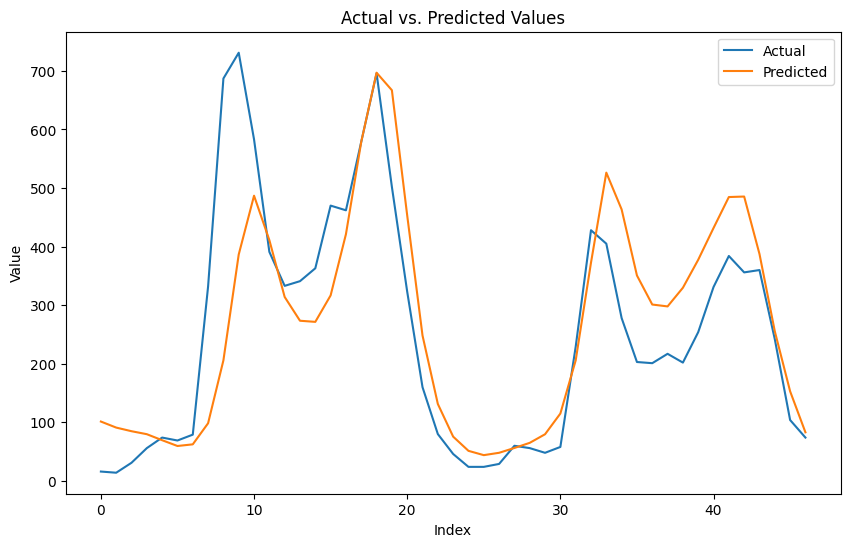

In [219]:

plt.figure(figsize=(10, 6))
plt.plot(y_test_original_slit, label='Actual')
plt.plot(y_pred_original_slit, label='Predicted')
plt.title('Actual vs. Predicted Values')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()

In [241]:
N_FEATURES

7